<a href="https://colab.research.google.com/github/ralphmartynward/ironhack_06_song-recommender/blob/master/notebooks/song_recommender.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**-> Pablo Vallejos / Jomana Bakhiet (Haithem) / Ralph Ward <-**
![logo](https://raw.githubusercontent.com/ralphmartynward/ironhack_06_song-recommender/master/hitmatch.png)


### Gdrive connection

In [ ]:
# Initiate Google Drive connection 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Lab 1: Hot songs
https://github.com/isg75/lab-web-scraping-single-page

In [ ]:
import requests
from bs4 import BeautifulSoup

def scrape_hot100():
    url = "https://www.billboard.com/charts/hot-100/"
    response = requests.get(url)
    soup = BeautifulSoup(response.text, "html.parser")
    
    song_elements = soup("div", class_="o-chart-results-list-row-container")
    #print("song_elements:", song_elements)
    
    songs = []
    for element in song_elements:
        song = {}
        song["title"] = element.find("h3").text.strip()
        song["artist"] = element.find("h3").find_next("span").text.strip()
        songs.append(song)
    
    #print("songs:", songs)
    
    hot100_df = pd.DataFrame(songs)
    return hot100_df

# Save the DataFrame to a CSV file
hot100_df.to_csv('../data/hot100_songs.csv', index=False)

hot100_df = scrape_hot100()
hot100_df.head()

,title,artist
0,Kill Bill,SZA
1,Last Night,Morgan Wallen
2,Flowers,Miley Cyrus
3,Princess Diana,Ice Spice & Nicki Minaj
4,Ella Baila Sola,Eslabon Armado X Peso Pluma


In [ ]:
# Ralph test 
# -> saving this on a database instead of a csv
# The goal being that we could host the database on a cloud service (such as Firebase) and call from there instead
!pip install tinydb
import os
from tinydb import TinyDB, Query
db_path = "/content/drive/My Drive/ironhack/song_recommender/data/hot100.json"
db = TinyDB(db_path)
db.insert_multiple(hot100_df.to_dict('records'))
hot100_df = pd.DataFrame(db.all())
hot100_df.head()

# Lab 2: Not hot songs
https://github.com/isg75/lab-not-hot-songs

In [ ]:
import pandas as pd

In [ ]:
# using this Kaggle dataset example https://www.kaggle.com/datasets/mrmorj/dataset-of-songs-in-spotify
not_hot_songs = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/tracks_features.csv')

In [ ]:
not_hot_songs.head()

,id,name,album,album_id,artists,artist_ids,track_number,disc_number,explicit,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year,release_date
0,7lmeHLHBe4nmXzuXc0HDjk,Testify,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],1,1,False,0.470,...,0.0727,0.02610,0.000011,0.3560,0.503,117.906,210133,4.0,1999,1999-11-02
1,1wsRitfRRtWyEapl0q22o8,Guerrilla Radio,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],2,1,True,0.599,...,0.1880,0.01290,0.000071,0.1550,0.489,103.680,206200,4.0,1999,1999-11-02
2,1hR0fIFK2qRG3f3RF70pb7,Calm Like a Bomb,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],3,1,False,0.315,...,0.4830,0.02340,0.000002,0.1220,0.370,149.749,298893,4.0,1999,1999-11-02
3,2lbASgTSoDO7MTuLAXlTW0,Mic Check,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],4,1,True,0.440,...,0.2370,0.16300,0.000004,0.1210,0.574,96.752,213640,4.0,1999,1999-11-02
4,1MQTmpYOZ6fcMQc56Hdo7T,Sleep Now In the Fire,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],5,1,False,0.426,...,0.0701,0.00162,0.105000,0.0789,0.539,127.059,205600,4.0,1999,1999-11-02


In [ ]:
not_hot_songs.shape

(1204025, 24)

In [ ]:
not_hot_songs.drop(['album', 'artist_ids', 'track_number', 'disc_number', 'duration_ms', 'release_date', 'year', 'album_id', 'explicit'], axis=1, inplace=True)

In [ ]:
not_hot_songs.isna().sum()

id                  0
name                0
artists             0
danceability        0
energy              0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
dtype: int64

In [ ]:
not_hot_songs['artists']=[i[2:-2] for i in not_hot_songs['artists'] if i[0] =='[']

In [ ]:
# maybe we should drop duplicates here too

In [ ]:
not_hot_songs.head()

,id,name,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,7lmeHLHBe4nmXzuXc0HDjk,Testify,Rage Against The Machine,0.470,0.978,7,-5.399,1,0.0727,0.02610,0.000011,0.3560,0.503,117.906,4.0
1,1wsRitfRRtWyEapl0q22o8,Guerrilla Radio,Rage Against The Machine,0.599,0.957,11,-5.764,1,0.1880,0.01290,0.000071,0.1550,0.489,103.680,4.0
2,1hR0fIFK2qRG3f3RF70pb7,Calm Like a Bomb,Rage Against The Machine,0.315,0.970,7,-5.424,1,0.4830,0.02340,0.000002,0.1220,0.370,149.749,4.0
3,2lbASgTSoDO7MTuLAXlTW0,Mic Check,Rage Against The Machine,0.440,0.967,11,-5.830,0,0.2370,0.16300,0.000004,0.1210,0.574,96.752,4.0
4,1MQTmpYOZ6fcMQc56Hdo7T,Sleep Now In the Fire,Rage Against The Machine,0.426,0.929,2,-6.729,1,0.0701,0.00162,0.105000,0.0789,0.539,127.059,4.0


In [ ]:
not_hot_songs = not_hot_songs.to_csv("/content/drive/My Drive/ironhack/song_recommender/data/not_hot_songs_features.csv", index=False)

In [ ]:
songs= not_hot_songs.drop(not_hot_songs.sample(frac=.998).index)
songs.shape

(2408, 14)

In [ ]:
songs = songs.to_csv("/content/drive/My Drive/ironhack/song_recommender/data/songs.csv", index=False)

In [ ]:
nothot= pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/songs.csv')

In [ ]:
nothot.head()


,id,name,artists,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,hot
0,2uAzh2c3VtiPxfpTH9oUTo,More Than Human,Bride,0.488,0.826,-6.494,1,0.0315,0.00535,0.0263,0.0851,0.473,90.029,4.0,0
1,2x1D20z93vGEjtTP07GOOr,Swear It Again - Radio Edit,Westlife,0.626,0.532,-7.205,1,0.0276,0.29600,0.0000,0.1230,0.330,130.076,4.0,0
2,3gMKfewkRN5XUDftzTgfcr,New Acid,Alec Empire,0.491,0.767,-11.035,1,0.0763,0.64200,0.9130,0.1380,0.162,73.489,4.0,0
3,74TmgG4aLSRify1y5lABhh,8-Ball Deluxe,7 Year Bitch,0.424,0.845,-6.272,1,0.0551,0.03960,0.0000,0.3420,0.791,122.911,4.0,0
4,1yZGylfVLuHDFJFeYwcmcW,Love Is An Army,LeAnn Rimes,0.425,0.238,-8.936,1,0.0354,0.83100,0.0000,0.1330,0.220,72.989,4.0,0


In [ ]:
# make this cleaning step of lab 2 into a function instead !

# Lab 3: Spotify API for features
https://github.com/isg75/lab-spotify-api

In [ ]:
! pip install spotipy
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

import sys
sys.path.append('/content/drive/My Drive/ironhack/song_recommender/config.py') # so that the credentials are fetched from the root and hidden
from config import client_id, client_secret

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id= client_id,
                                                           client_secret= client_secret))

In [ ]:
!pip show config

Name: config
Version: 0.5.1
Summary: A hierarchical, easy-to-use, powerful configuration module for Python
Home-page: http://docs.red-dove.com/cfg/python.html
Author: Vinay Sajip
Author-email: vinay_sajip@red-dove.com
License: Copyright (C) 2004-2020 by Vinay Sajip. All Rights Reserved. See LICENSE for license.
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: 


In [ ]:
import pandas as pd 
hot100_df = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/hot100_songs.csv')

In [ ]:
# find spotify id of each song in "hot" (sp.search()) https://spotipy.readthedocs.io/en/2.22.1/
def get_spotify_id(song_title, artist_name):
    query = f"{song_title} artist:{artist_name}"
    results = sp.search(q=query, type="track", limit=1)
    
    if results["tracks"]["total"] > 0:
        return results["tracks"]["items"][0]["id"]
    else:
        return None


hot100_df['id'] = hot100_df.apply(lambda row: get_spotify_id(row['Song'], row['Artist']), axis=1)

# improve this by printing status per song searched (finding song / found song)

In [ ]:
hot100_df['id'].isna().sum()

In [ ]:
# Not the best results, 70%, not sure if there is a better way to search ?
# drop those rows otherwise as they are null

In [ ]:
hot100_df = hot100_df.dropna(subset=['id'])

In [ ]:
# If we had more than 100 IDs to search, it's best to put it in a list ready for the next step
# And use chunks 

In [ ]:
# get song features for each song (sp.audio_features())
def get_audio_features(spotify_id):
    if spotify_id is None:
        return None
    else:
        return sp.audio_features([spotify_id])[0]

hot100_df['features'] = hot100_df['id'].apply(get_audio_features)


In [ ]:
hot100_df.head()

In [ ]:
# json format, not ideal, we'd need to beautify this into columns
# only get these features 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness' ,'valence', 'tempo', 'duration_ms', 'time_signature', 'year'
feature_columns = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature']
for feature in feature_columns:
    hot100_df[feature] = hot100_df['features'].apply(lambda x: x[feature] if x is not None else None)

# make this into a function "add_audio_features(df, audio_features_df)"

In [ ]:
hot100_df.rename(columns={'Song': 'name'}, inplace=True)
hot100_df.rename(columns={'Artist': 'artists'}, inplace=True)
hot100_df = hot100_df[['id', 'name', 'artists', 'danceability', 'energy', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']]

In [ ]:
hot100_df

In [ ]:
# after adding the features, save the dataframes (hot and not-hot) into csv files 
hot100_df = hot100_df.to_csv("/content/drive/My Drive/ironhack/song_recommender/data/hot100_df_features.csv", index=False)

In [ ]:
hot_songs['hot'] = 1
not_hot_songs['hot'] = 0
all_songs = pd.concat([hot_songs, not_hot_songs], ignore_index=True)
all_songs = all_songs.to_csv("/content/drive/My Drive/ironhack/song_recommender/data/all_songs.csv", index=False)

In [ ]:
all_songs = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/all_songs.csv')

In [ ]:
all_songs.head()

In [ ]:
nothot['hot'] = 0
hot_songs['hot'] = 1
all_songs_sampled = pd.concat([hot_songs, nothot], ignore_index=True)
all_songs_sampled.head()

# Lab 4: Clustering songs
https://github.com/isg75/lab-clustering-songs

In [ ]:
import pandas as pd 
hot_songs = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/hot100_df_features.csv')
not_hot_songs = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/not_hot_songs_features.csv')
not_hot_songs_sample = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/songs.csv')
all_songs = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/all_songs.csv')

In [ ]:
not_hot_songs_sample['hot'] = 0
hot_songs['hot'] = 1
all_songs_sampled = pd.concat([hot_songs, not_hot_songs_sample], ignore_index=True)
all_songs_sampled.head()

,id,name,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,hot
0,59uQI0PADDKeE6UZDTJEe8,Last Night,Morgan Wallen,0.517,0.675,6.0,-5.382,1,0.0357,0.4590,0.000000,0.1510,0.518,203.853,4.0,1
1,0yLdNVWF3Srea0uzk55zFn,Flowers,Miley Cyrus,0.707,0.681,0.0,-4.325,1,0.0668,0.0632,0.000005,0.0322,0.646,117.999,4.0,1
2,2dHHgzDwk4BJdRwy9uXhTO,Creepin',"Metro Boomin, The Weeknd & 21 Savage",0.715,0.620,1.0,-6.005,0,0.0484,0.4170,0.000000,0.0822,0.172,97.950,4.0,1
3,1s7oOCT8vauUh01PbJD6ps,Calm Down,Rema & Selena Gomez,0.799,0.802,11.0,-5.196,1,0.0371,0.4290,0.001280,0.1710,0.811,107.008,4.0,1
4,7aRCf5cLOFN1U7kvtChY1G,Search & Rescue,Drake,0.817,0.440,10.0,-8.482,0,0.0734,0.0603,0.000001,0.3300,0.544,142.024,4.0,1


### Scaling

In [ ]:
import numpy as np
all_songs_sampled_num = all_songs_sampled.select_dtypes(np.number)
all_songs_sampled_num.head()

# Are you going to use all the audio features? If not, which ones do you think that makes more sense to be used?
# drop key, time_signature, loudness and mode? 
all_songs_sampled_num = all_songs_sampled_num.drop(['key', 'time_signature', 'loudness'], axis = 1)

In [ ]:
X = all_songs_sampled_num

In [ ]:
# Scale the values 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X) #to be applied on both datasets 
X_scaled_np = scaler.transform(X)
filename = "/content/drive/My Drive/ironhack/song_recommender/models/scaler/scaler.pickle" # Path with filename

# save in pickle file
import pickle
with open(filename, "wb") as file:
        pickle.dump(scaler,file)

X_scaled_df = pd.DataFrame(X_scaled_np, columns=X.columns)

### Google Colab upgrade

In [ ]:
# For computing high data volumes, use this function to run on a premium GPU in gColab
# https://colab.research.google.com/notebooks/pro.ipynb

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu May  4 07:42:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    23W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### PCA

In [ ]:
# Test applying PCA here as we have high dimensionality with big datasets 
# the amount of variances by default will be the amount of features in the data 
from sklearn.decomposition import PCA
pca = PCA() # PCA(n_components=8)
pca.fit(X_scaled_df)
print(pca.explained_variance_ratio_)

[0.30407902 0.13948593 0.12122124 0.10711874 0.09592956 0.08743216
 0.07969879 0.04534576 0.01968881]


In [ ]:
0.30407902+0.13948593+0.12122124+0.10711874+0.09592956

0.7678344899999999

In [ ]:
# Using PCA will maybe not be the most useful in our case, as there are not a select few features that makes up most of the ratio
# but we can still conclude that the cumulative first 4-5 components have the biggest impact, which can be helpful for checking the scatter plots

## DBSCAN

In [ ]:
# number of features * 2 
# optimal parameters for epsilon; get all k (min points nearest neighbours) ; sort distances ; plot average distance & k-neighbors ; select distance where there's an elbow

In [ ]:
from sklearn.cluster import DBSCAN
model = DBSCAN() # eps=0.30, min_samples=9: Default values are: eps=0.5, min_samples=5
# fit model and predict clusters
#model.fit(X)
#yhat = model.predict(X)
yhat = model.fit_predict(X_scaled_df)
print("The Silhouette score of the model is: ",round(silhouette_score(X_scaled_df, model.fit_predict(X_scaled_df)),2))

The Silhouette score of the model is:  -0.38


In [ ]:
X['cluster'] = yhat
X.head()

,danceability,energy,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,hot,cluster
0,0.517,0.675,1,0.0357,0.4590,0.000000,0.1510,0.518,203.853,1,-1
1,0.707,0.681,1,0.0668,0.0632,0.000005,0.0322,0.646,117.999,1,-1
2,0.715,0.620,0,0.0484,0.4170,0.000000,0.0822,0.172,97.950,1,-1
3,0.799,0.802,1,0.0371,0.4290,0.001280,0.1710,0.811,107.008,1,-1
4,0.817,0.440,0,0.0734,0.0603,0.000001,0.3300,0.544,142.024,1,-1


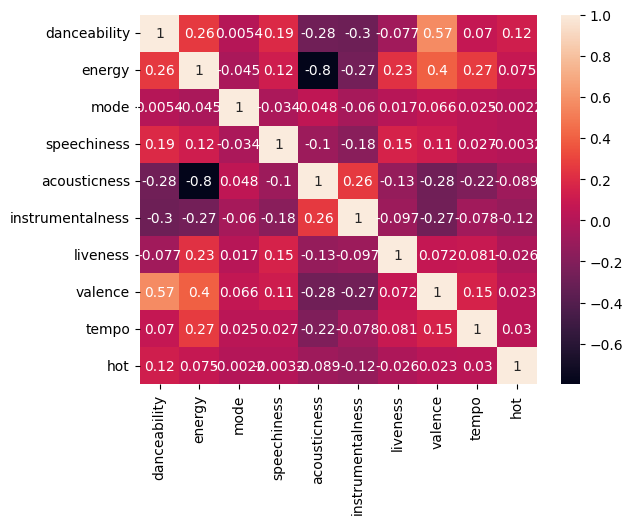

In [ ]:
import seaborn as sns

sns.heatmap(data=X.corr(), annot=True)
plt.show()

In [ ]:
# retrieve unique clusters
clusters = np.unique(yhat)
clusters # DBSCAN flags with "-1" noisy data.

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

IndexError: ignored

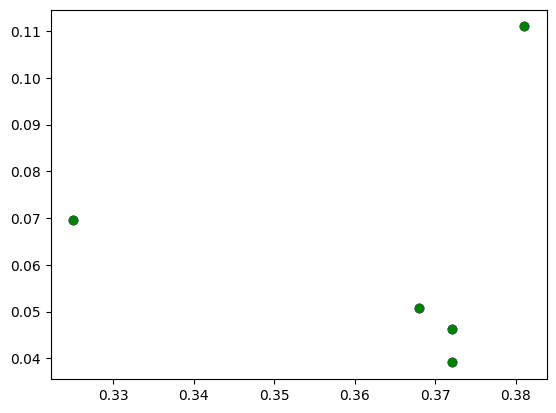

In [ ]:
# checking 2 features with this chart

%matplotlib inline
#X_df['clusters'] = clusters
# create scatter plot for samples from each cluster
colors = ["b", "magenta", "green"]
for index, cluster in enumerate(list(clusters)):
	# get row indexes for samples with this cluster
	#row_ix = np.where(yhat == cluster)
	#X_df[X_df['clusters'] == cluster]
	# create scatter of these samples
	#plt.scatter(X[row_ix, 0], X[row_ix, 1])
	if (cluster == -1): 
		c_label = "Noise"
	else:
		c_label = "Cluster_" + str(cluster)
	c_color = colors[index]
	plt.scatter(X[X['cluster']==cluster]['danceability'],X[X['cluster']==cluster]['valence'], color=c_color, label=c_label)
	# plt.scatter(X_df.iloc[row_ix,0],X_df.iloc[row_ix,1])

# show the plot
plt.title("Clusters detected by DBSCAN, blue dots are considered Noise")
plt.legend()
plt.show()

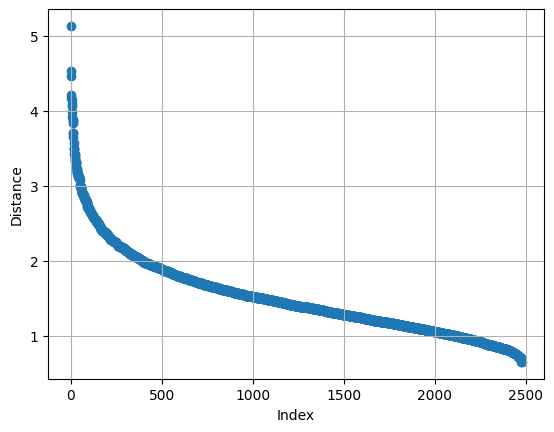

In [ ]:
# Fine tuning: In order to find out the best value for epsilon, we follow these steps:

# 1. Compute the distance matrix between the all the observations
from scipy.spatial import distance_matrix
d = distance_matrix(X_scaled_df,X_scaled_df)
# 2. We fix the number of nearest neighbours **k** to MinPoints= 2*number_of_features
d2 = np.sort(d)[:,1:]
# 3. We get all the distances from each point to it's k-nearest-neighbourgh.
k = 16 # 8 features * 2
f = d2[:, k - 1]
# 4. We sort all those distances in descending order.
f_final = np.sort(f)[::-1]

# 5. We plot those distances.
plt.scatter(range(1,len(f_final)+1), f_final)
plt.xlabel("Index")
plt.ylabel("Distance")

plt.grid()
plt.show()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


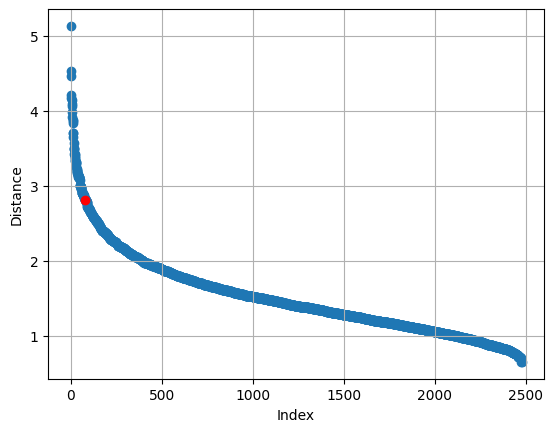

Elbow point (knee point) index: 81, value: 2.805745691534286


In [ ]:
# use knee locator instead to get a more precise value

!pip install kneed
from kneed import KneeLocator

knee_locator = KneeLocator(range(1, len(f_final) + 1), f_final, curve="convex", direction="decreasing")

# Get the elbow point (knee point)
elbow_point = knee_locator.knee
elbow_value = knee_locator.knee_y

plt.scatter(range(1, len(f_final) + 1), f_final)
plt.scatter(elbow_point, elbow_value, color='red', marker='o')
plt.xlabel("Index")
plt.ylabel("Distance")
plt.grid()
plt.show()

print(f"Elbow point (knee point) index: {elbow_point}, value: {elbow_value}")

In [ ]:
# Explore Epsilon values 

models = {}

knee_point = 2.8
lower_bound = knee_point - 0.5
upper_bound = knee_point + 0.5
step_size = 0.01

for value in np.arange(lower_bound, upper_bound, step_size): #change to values that the curve shows a break 
    model = DBSCAN(eps=value, min_samples=16) # min_samples = 2 * #features
    # fit model and predict clusters
    yhat = model.fit_predict(X_scaled_df)
    
    unique_labels = len(np.unique(yhat))
    
    if unique_labels > 1:
        score =  round(silhouette_score(X_scaled_df, yhat), 2)
        models["model_"+str(round(value,2))] = {"model":model, "yhat": yhat, "score": score}

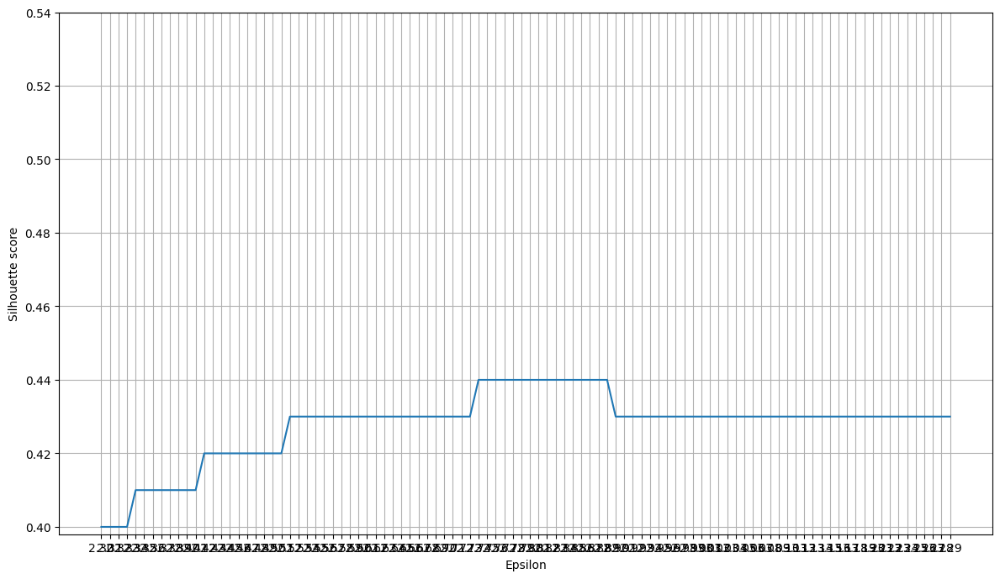

In [ ]:
import matplotlib.ticker as ticker

epsilon_score_tuples = [(round(float(key.split("_")[1]), 2), item["score"]) for key, item in models.items()]

epsilons, scores = zip(*epsilon_score_tuples)

fig, ax = plt.subplots(figsize=(12,7))
ax.plot(epsilons, scores)
ax.set_xlabel("Epsilon")
ax.set_ylabel("Silhouette score")
ax.xaxis.set_ticks(np.arange(min(epsilons), max(epsilons), 0.01))
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.2f'))
ax.yaxis.set_ticks(np.arange(min(scores), max(scores)+0.1, 0.02))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.2f'))
plt.grid()
plt.tight_layout()
plt.show()


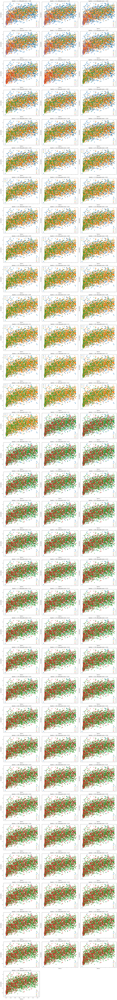

In [ ]:
# Specify the column names for the features to plot
x_feature = 'valence'
y_feature = 'danceability'

# Create scatter plots for samples from each model
n_models = len(models)
n_rows = int(np.ceil(n_models / 3))
fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 5), sharex=True, sharey=True)
axs = axs.flatten()

for index, item in enumerate(models.items()):
    model_label, model_data = item
    yhat = model_data['yhat']
    score = model_data['score']

    for cluster in np.unique(yhat):
        row_ix = np.where(yhat == cluster)[0]
        x_values = X_scaled_df.iloc[row_ix][x_feature]
        y_values = X_scaled_df.iloc[row_ix][y_feature]
        axs[index].scatter(x_values, y_values, label=str(cluster))

    axs[index].set_xlabel(x_feature.capitalize())
    axs[index].set_ylabel(y_feature.capitalize())
    axs[index].set_title(f"Epsilon = {model_label.split('_')[1]}, Silhouette score = {score}")
    axs[index].legend()

# Remove unused subplots
for i in range(n_models, len(axs)):
    fig.delaxes(axs[i])

# Show the plot
plt.tight_layout()
plt.show()


## K-means

Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 35905.6709242656.
Iteration 1, inertia 23135.463353330066.


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 2, inertia 22800.80906360536.
Iteration 3, inertia 21795.92520690164.
Iteration 4, inertia 20359.286393362465.
Iteration 5, inertia 19873.665270115707.
Iteration 6, inertia 19811.958048366378.
Iteration 7, inertia 19799.23350123948.
Iteration 8, inertia 19794.393272361012.
Iteration 9, inertia 19791.603389547494.
Iteration 10, inertia 19790.805470860363.
Iteration 11, inertia 19790.456743446673.
Converged at iteration 11: center shift 2.9562534895414578e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 25698.88812850614.
Iteration 1, inertia 19853.941881687664.
Iteration 2, inertia 19800.30971092242.
Iteration 3, inertia 19793.667733019945.
Iteration 4, inertia 19792.042286008775.
Iteration 5, inertia 19791.194616361157.
Iteration 6, inertia 19790.522948930306.
Converged at iteration 6: center shift 9.06326689850617e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 28757.591261411057.
Iteration 1, i

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 1, inertia 20413.875156805603.
Iteration 2, inertia 19220.689631259167.
Iteration 3, inertia 18866.331718682737.
Iteration 4, inertia 18772.433733830472.
Iteration 5, inertia 18750.01664355291.
Iteration 6, inertia 18743.916327944095.
Iteration 7, inertia 18742.350029846737.
Iteration 8, inertia 18740.89265871422.
Iteration 9, inertia 18739.06551284717.
Iteration 10, inertia 18737.362681664417.
Iteration 11, inertia 18737.18286401164.
Iteration 12, inertia 18736.871194324918.
Iteration 13, inertia 18736.7930767796.
Converged at iteration 13: center shift 1.641486190503723e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 26915.627884676465.
Iteration 1, inertia 17405.673643518247.
Iteration 2, inertia 17328.158390398366.
Iteration 3, inertia 17319.02364923548.
Iteration 4, inertia 17316.36956797402.
Converged at iteration 4: center shift 4.510835816196143e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, in

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 21728.931706944597.
Iteration 1, inertia 16307.558389997334.
Iteration 2, inertia 15824.511499836153.
Iteration 3, inertia 15732.871494157775.
Iteration 4, inertia 15719.107162263073.
Iteration 5, inertia 15715.619814127496.
Iteration 6, inertia 15715.228398808631.
Converged at iteration 6: center shift 1.2714906983061132e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 23370.641677152737.
Iteration 1, inertia 17513.911810417354.
Iteration 2, inertia 17262.53112730715.
Iteration 3, inertia 17142.841227128236.
Iteration 4, inertia 17088.539061369906.
Iteration 5, inertia 17056.216903406574.
Iteration 6, inertia 17036.139125649148.
Iteration 7, inertia 17026.10863609415.
Iteration 8, inertia 17018.660516985725.
Iteration 9, inertia 17012.656068487035.
Iteration 10, inertia 17010.546428161215.
Iteration 11, inertia 17009.03969108057.
Iteration 12, inertia 17008.26216505205.
Iteration 13, inertia 17008.121599431317.
Converged at 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 21142.13494408833.
Iteration 1, inertia 15303.201333863904.
Iteration 2, inertia 14712.851013348953.
Iteration 3, inertia 14442.16718477803.
Iteration 4, inertia 14355.352153353933.
Iteration 5, inertia 14324.924337497987.
Iteration 6, inertia 14301.939726741377.
Iteration 7, inertia 14280.063428904119.
Iteration 8, inertia 14260.0672073624.
Iteration 9, inertia 14249.604501512578.
Iteration 10, inertia 14246.180265447714.
Iteration 11, inertia 14245.732409727325.
Iteration 12, inertia 14245.57808375881.
Iteration 13, inertia 14245.447041044148.
Iteration 14, inertia 14245.29885413567.
Iteration 15, inertia 14245.25862812108.
Iteration 16, inertia 14245.227777900618.
Converged at iteration 16: strict convergence.
Initialization complete
Iteration 0, inertia 20772.32403612753.
Iteration 1, inertia 15936.564996147621.
Iteration 2, inertia 15745.045938767707.
Iteration 3, inertia 15560.958483739365.
Iteration 4, inertia 15311.328032153278.
Iteration 5, inertia 15105.4

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 19115.24138957707.
Iteration 1, inertia 13741.191969436031.
Iteration 2, inertia 13389.229151391875.
Iteration 3, inertia 13307.600361567307.
Iteration 4, inertia 13253.91092878441.
Iteration 5, inertia 13218.773272854654.
Iteration 6, inertia 13189.769658563251.
Iteration 7, inertia 13168.002744203648.
Iteration 8, inertia 13158.321500880535.
Iteration 9, inertia 13151.754759871588.
Iteration 10, inertia 13146.337165069752.
Iteration 11, inertia 13145.10825975113.
Iteration 12, inertia 13144.035947697219.
Iteration 13, inertia 13143.64640876269.
Iteration 14, inertia 13143.558967022776.
Converged at iteration 14: center shift 1.6946563232988928e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 18748.326299373275.
Iteration 1, inertia 13698.29948320475.
Iteration 2, inertia 13521.047279725246.
Iteration 3, inertia 13483.88085881489.
Iteration 4, inertia 13471.85717382743.
Iteration 5, inertia 13466.461669411427.
Iteration 6, i

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 3, inertia 12758.331476891968.
Iteration 4, inertia 12699.922204611954.
Iteration 5, inertia 12679.250994367572.
Iteration 6, inertia 12672.397696450029.
Iteration 7, inertia 12668.150946409318.
Iteration 8, inertia 12666.158994753638.
Iteration 9, inertia 12663.493817981996.
Iteration 10, inertia 12661.943494157398.
Iteration 11, inertia 12661.717642573312.
Iteration 12, inertia 12661.499187110616.
Iteration 13, inertia 12661.391334698254.
Iteration 14, inertia 12660.958277398799.
Iteration 15, inertia 12660.607578525332.
Iteration 16, inertia 12660.422610539721.
Iteration 17, inertia 12660.209891258404.
Iteration 18, inertia 12660.08588118977.
Converged at iteration 18: center shift 7.887687591176342e-05 within tolerance 9.999999999999784e-05.
Initialization complete
Iteration 0, inertia 18134.886258301307.
Iteration 1, inertia 13246.789871287261.
Iteration 2, inertia 12551.376252389864.
Iteration 3, inertia 12259.844491186363.
Iteration 4, inertia 12140.426477332616.
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 16817.76815618592.
Iteration 1, inertia 13453.853389818214.
Iteration 2, inertia 13137.095146557263.
Iteration 3, inertia 12998.556402825481.
Iteration 4, inertia 12883.869536005717.
Iteration 5, inertia 12757.794990969867.
Iteration 6, inertia 12644.170131665313.
Iteration 7, inertia 12547.719179882099.
Iteration 8, inertia 12447.130453664244.
Iteration 9, inertia 12343.268694945578.
Iteration 10, inertia 12226.798658968313.
Iteration 11, inertia 12149.036609659948.
Iteration 12, inertia 12098.822379361322.
Iteration 13, inertia 12077.852031069875.
Iteration 14, inertia 12068.851440852193.
Iteration 15, inertia 12062.443929904024.
Iteration 16, inertia 12060.378073766911.
Iteration 17, inertia 12060.046531294136.
Iteration 18, inertia 12059.867207824598.
Iteration 19, inertia 12059.749467417898.
Converged at iteration 19: strict convergence.
Initialization complete
Iteration 0, inertia 17544.036471744243.
Iteration 1, inertia 12394.655809226211.
Iteration 2, inert

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 16610.148643074233.
Iteration 1, inertia 11512.582440061831.
Iteration 2, inertia 11079.427393909646.
Iteration 3, inertia 10940.492205276929.
Iteration 4, inertia 10883.537164529862.
Iteration 5, inertia 10848.505668703798.
Iteration 6, inertia 10816.046201301404.
Iteration 7, inertia 10791.812345039398.
Iteration 8, inertia 10776.150849368176.
Iteration 9, inertia 10770.561331054778.
Iteration 10, inertia 10766.660188930324.
Iteration 11, inertia 10763.309395221253.
Iteration 12, inertia 10759.392935449363.
Iteration 13, inertia 10756.379526220293.
Iteration 14, inertia 10752.30772662352.
Iteration 15, inertia 10747.10522777686.
Iteration 16, inertia 10741.961362885555.
Iteration 17, inertia 10737.898646306145.
Iteration 18, inertia 10735.569042401905.
Iteration 19, inertia 10733.34839703649.
Iteration 20, inertia 10732.396933583443.
Iteration 21, inertia 10731.578028418928.
Iteration 22, inertia 10731.084636507334.
Iteration 23, inertia 10730.925762403169.
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 14619.080759509921.
Iteration 1, inertia 11801.139814065387.
Iteration 2, inertia 11423.79485620793.
Iteration 3, inertia 11228.252812971514.
Iteration 4, inertia 11051.683577690817.
Iteration 5, inertia 10921.861370668594.
Iteration 6, inertia 10808.998751485884.
Iteration 7, inertia 10715.157287995604.
Iteration 8, inertia 10652.013464751064.
Iteration 9, inertia 10604.135361264825.
Iteration 10, inertia 10562.61260105736.
Iteration 11, inertia 10506.767796876848.
Iteration 12, inertia 10451.415292603599.
Iteration 13, inertia 10408.829827363938.
Iteration 14, inertia 10373.394666335014.
Iteration 15, inertia 10331.635818907349.
Iteration 16, inertia 10311.367089171436.
Iteration 17, inertia 10295.402810101015.
Iteration 18, inertia 10281.508095060437.
Iteration 19, inertia 10274.30211664539.
Iteration 20, inertia 10268.484024880296.
Iteration 21, inertia 10260.945849265208.
Iteration 22, inertia 10258.247798744876.
Iteration 23, inertia 10257.064903386936.
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 5, inertia 10752.311713645318.
Iteration 6, inertia 10672.991682446454.
Iteration 7, inertia 10625.50790796116.
Iteration 8, inertia 10586.776079107967.
Iteration 9, inertia 10555.724106918338.
Iteration 10, inertia 10528.202457055977.
Iteration 11, inertia 10496.794687114507.
Iteration 12, inertia 10414.131995907588.
Iteration 13, inertia 10266.257633180321.
Iteration 14, inertia 10167.84403602495.
Iteration 15, inertia 10124.110452462759.
Iteration 16, inertia 10090.31794274305.
Iteration 17, inertia 10056.450592079.
Iteration 18, inertia 10035.416611316776.
Iteration 19, inertia 10012.25638783153.
Iteration 20, inertia 9979.542454448432.
Iteration 21, inertia 9960.464343843074.
Iteration 22, inertia 9949.901609480114.
Iteration 23, inertia 9942.475735146652.
Iteration 24, inertia 9939.307416752312.
Iteration 25, inertia 9935.98372353398.
Iteration 26, inertia 9932.043374134655.
Iteration 27, inertia 9930.373701273174.
Iteration 28, inertia 9929.352167950343.
Iteration 29, 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 14755.762137754788.
Iteration 1, inertia 11602.75253949098.
Iteration 2, inertia 11144.616551274696.
Iteration 3, inertia 10802.376065479242.
Iteration 4, inertia 10546.985027709332.
Iteration 5, inertia 10341.343535909073.
Iteration 6, inertia 10182.717994717306.
Iteration 7, inertia 10074.47333016819.
Iteration 8, inertia 10017.011277117583.
Iteration 9, inertia 9963.658097074818.
Iteration 10, inertia 9905.853806003184.
Iteration 11, inertia 9824.546779323018.
Iteration 12, inertia 9735.479967014979.
Iteration 13, inertia 9681.53496068619.
Iteration 14, inertia 9649.97306455978.
Iteration 15, inertia 9617.217869014288.
Iteration 16, inertia 9552.167213033988.
Iteration 17, inertia 9511.514850002617.
Iteration 18, inertia 9497.096226826869.
Iteration 19, inertia 9491.89306200545.
Iteration 20, inertia 9488.502758074213.
Iteration 21, inertia 9485.710511871066.
Iteration 22, inertia 9483.522159200096.
Iteration 23, inertia 9482.11639086169.
Iteration 24, inertia 9

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 13737.847757456992.
Iteration 1, inertia 10208.964797518269.
Iteration 2, inertia 9767.805186013633.
Iteration 3, inertia 9611.606927369887.
Iteration 4, inertia 9497.161206332854.
Iteration 5, inertia 9417.63192236264.
Iteration 6, inertia 9368.711725486417.
Iteration 7, inertia 9350.65516262578.
Iteration 8, inertia 9343.55931879119.
Iteration 9, inertia 9338.48428946605.
Iteration 10, inertia 9334.820613319303.
Iteration 11, inertia 9333.0221727815.
Iteration 12, inertia 9331.961141764808.
Iteration 13, inertia 9330.96728982321.
Iteration 14, inertia 9330.22033721033.
Iteration 15, inertia 9329.72010156965.
Iteration 16, inertia 9329.118969629793.
Iteration 17, inertia 9328.826161398976.
Iteration 18, inertia 9328.797300560118.
Converged at iteration 18: strict convergence.
Initialization complete
Iteration 0, inertia 14226.788452283014.
Iteration 1, inertia 10951.193239579665.
Iteration 2, inertia 10522.050096081135.
Iteration 3, inertia 10235.186430467636.
Ite

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 12823.937989540917.
Iteration 1, inertia 9820.56839964079.
Iteration 2, inertia 9552.944629252483.
Iteration 3, inertia 9459.547756257762.
Iteration 4, inertia 9379.756715086083.
Iteration 5, inertia 9320.967965198883.
Iteration 6, inertia 9276.669476893148.
Iteration 7, inertia 9250.383634704765.
Iteration 8, inertia 9227.863897217785.
Iteration 9, inertia 9214.445780068912.
Iteration 10, inertia 9205.916891724191.
Iteration 11, inertia 9199.236330857033.
Iteration 12, inertia 9196.439750132999.
Iteration 13, inertia 9195.400156433047.
Iteration 14, inertia 9194.696366259626.
Iteration 15, inertia 9193.920708488451.
Iteration 16, inertia 9193.632928165433.
Converged at iteration 16: strict convergence.
Initialization complete
Iteration 0, inertia 12726.676647535147.
Iteration 1, inertia 10079.190920268178.
Iteration 2, inertia 9712.298036425545.
Iteration 3, inertia 9603.009280273402.
Iteration 4, inertia 9534.87752917583.
Iteration 5, inertia 9490.554650713246.
I

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 12605.267217934905.
Iteration 1, inertia 9685.720655362762.
Iteration 2, inertia 9343.200672254374.
Iteration 3, inertia 9164.918213655448.
Iteration 4, inertia 9071.549855448013.
Iteration 5, inertia 9028.489935615524.
Iteration 6, inertia 9004.583613429088.
Iteration 7, inertia 8994.331411816569.
Iteration 8, inertia 8984.918351077513.
Iteration 9, inertia 8979.057303125506.
Iteration 10, inertia 8976.336686395905.
Iteration 11, inertia 8974.011757757104.
Iteration 12, inertia 8970.944469744205.
Iteration 13, inertia 8969.78970428756.
Iteration 14, inertia 8968.317968709962.
Iteration 15, inertia 8966.945337379073.
Iteration 16, inertia 8965.212592275282.
Iteration 17, inertia 8961.823259647303.
Iteration 18, inertia 8955.621471258637.
Iteration 19, inertia 8941.824730834931.
Iteration 20, inertia 8932.33275991709.
Iteration 21, inertia 8928.137321001055.
Iteration 22, inertia 8927.045701934669.
Iteration 23, inertia 8926.628389448768.
Iteration 24, inertia 8926.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 12447.140460581802.
Iteration 1, inertia 9453.09093731013.
Iteration 2, inertia 8945.564032616132.
Iteration 3, inertia 8741.726635322617.
Iteration 4, inertia 8673.581851737965.
Iteration 5, inertia 8635.058674439462.
Iteration 6, inertia 8607.944994438234.
Iteration 7, inertia 8580.713010203666.
Iteration 8, inertia 8561.624353691897.
Iteration 9, inertia 8545.307079266207.
Iteration 10, inertia 8531.530103811569.
Iteration 11, inertia 8521.383020426587.
Iteration 12, inertia 8510.564926830031.
Iteration 13, inertia 8504.385007921024.
Iteration 14, inertia 8501.109787976216.
Iteration 15, inertia 8499.146226189836.
Iteration 16, inertia 8497.888524519789.
Iteration 17, inertia 8496.485249957801.
Iteration 18, inertia 8495.832523943263.
Iteration 19, inertia 8495.593416473857.
Iteration 20, inertia 8495.440045392741.
Iteration 21, inertia 8495.272393512121.
Iteration 22, inertia 8494.756094578372.
Iteration 23, inertia 8493.91793965559.
Iteration 24, inertia 8493.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 11790.616525504134.
Iteration 1, inertia 9024.863857443223.
Iteration 2, inertia 8725.435527093205.
Iteration 3, inertia 8633.964825188457.
Iteration 4, inertia 8589.544930815377.
Iteration 5, inertia 8556.946043749484.
Iteration 6, inertia 8520.989695025763.
Iteration 7, inertia 8491.933981144684.
Iteration 8, inertia 8469.125586646122.
Iteration 9, inertia 8449.611614880285.
Iteration 10, inertia 8437.256544775799.
Iteration 11, inertia 8432.732992828365.
Iteration 12, inertia 8429.23990237423.
Iteration 13, inertia 8423.836761982346.
Iteration 14, inertia 8420.074393540806.
Iteration 15, inertia 8416.52019380943.
Iteration 16, inertia 8413.418322544347.
Iteration 17, inertia 8410.071653897736.
Iteration 18, inertia 8403.221779087347.
Iteration 19, inertia 8392.373825476041.
Iteration 20, inertia 8368.28198491966.
Iteration 21, inertia 8345.634460393268.
Iteration 22, inertia 8333.724621030604.
Iteration 23, inertia 8320.219106601915.
Iteration 24, inertia 8283.4

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 11460.797431970579.
Iteration 1, inertia 8986.740218678618.
Iteration 2, inertia 8588.853449836099.
Iteration 3, inertia 8463.930521293616.
Iteration 4, inertia 8388.619760710752.
Iteration 5, inertia 8352.008769613412.
Iteration 6, inertia 8323.313138517322.
Iteration 7, inertia 8304.576218065507.
Iteration 8, inertia 8291.112437395497.
Iteration 9, inertia 8279.30059989106.
Iteration 10, inertia 8269.661797044762.
Iteration 11, inertia 8262.27379552958.
Iteration 12, inertia 8259.187223249168.
Iteration 13, inertia 8254.62793958862.
Iteration 14, inertia 8249.133295386317.
Iteration 15, inertia 8244.794359890866.
Iteration 16, inertia 8237.540473771418.
Iteration 17, inertia 8232.435438802264.
Iteration 18, inertia 8229.878228453415.
Iteration 19, inertia 8227.37413752308.
Iteration 20, inertia 8226.28885974519.
Iteration 21, inertia 8225.970361784068.
Iteration 22, inertia 8225.569175757444.
Iteration 23, inertia 8225.469086812454.
Converged at iteration 23: cen

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 0, inertia 10631.664304372338.
Iteration 1, inertia 8345.404283010952.
Iteration 2, inertia 8098.044867603198.
Iteration 3, inertia 7994.7524688005915.
Iteration 4, inertia 7957.759883754083.
Iteration 5, inertia 7938.556161393139.
Iteration 6, inertia 7926.68748303556.
Iteration 7, inertia 7915.18600627197.
Iteration 8, inertia 7905.196109715424.
Iteration 9, inertia 7898.821919016589.
Iteration 10, inertia 7894.37353619991.
Iteration 11, inertia 7888.475519791921.
Iteration 12, inertia 7879.587130584478.
Iteration 13, inertia 7869.163362186537.
Iteration 14, inertia 7862.171228272521.
Iteration 15, inertia 7855.02391374747.
Iteration 16, inertia 7849.8799398034835.
Iteration 17, inertia 7846.56851047855.
Iteration 18, inertia 7844.475205847234.
Iteration 19, inertia 7841.659702215698.
Iteration 20, inertia 7839.182353638887.
Iteration 21, inertia 7837.939604393508.
Iteration 22, inertia 7837.031429987178.
Iteration 23, inertia 7836.2866160634785.
Iteration 24, inertia 7834.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 3, inertia 7999.374142905595.
Iteration 4, inertia 7937.9270485105035.
Iteration 5, inertia 7895.241314514932.
Iteration 6, inertia 7864.215126881308.
Iteration 7, inertia 7834.437586969199.
Iteration 8, inertia 7803.980330001651.
Iteration 9, inertia 7759.811989459535.
Iteration 10, inertia 7729.330500995557.
Iteration 11, inertia 7715.30175586833.
Iteration 12, inertia 7706.207191986724.
Iteration 13, inertia 7698.533889811595.
Iteration 14, inertia 7694.796933360911.
Iteration 15, inertia 7693.357746518785.
Iteration 16, inertia 7692.579049933329.
Iteration 17, inertia 7692.141302624998.
Iteration 18, inertia 7691.728065854645.
Iteration 19, inertia 7691.687978788646.
Converged at iteration 19: strict convergence.
Initialization complete
Iteration 0, inertia 10859.32861498331.
Iteration 1, inertia 8336.804777312358.
Iteration 2, inertia 8008.607001341367.
Iteration 3, inertia 7856.296168817353.
Iteration 4, inertia 7807.8522195178175.
Iteration 5, inertia 7783.986739912143

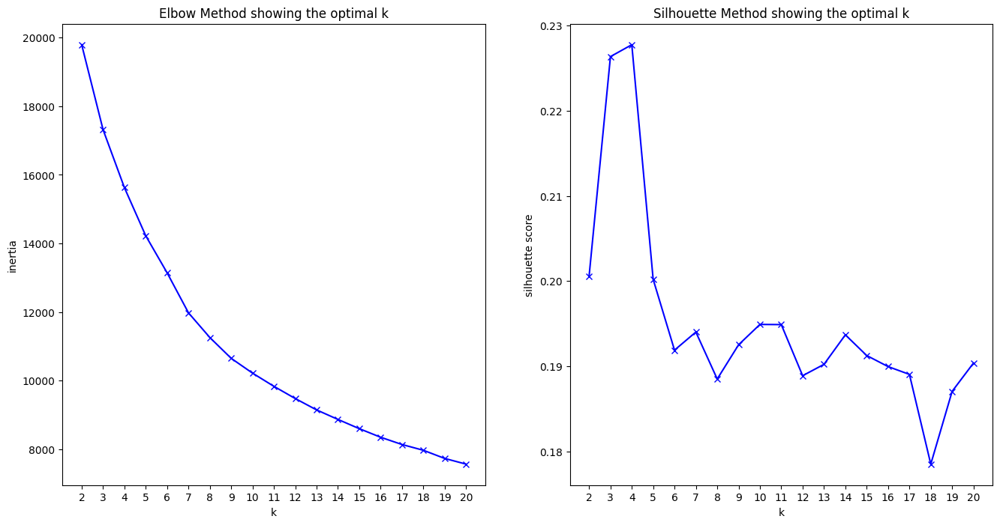

In [ ]:
# clustering with K-means / default cluster number will be 8, use init to change 
# What is the optimal number of clusters (for methods that need to know this beforehand)?
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt
import pickle

K = range(2, 21)

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k, random_state=1234, verbose=1)
    kmeans.fit(X_scaled_df)
    
    # Save in pickle file the iterations
    filename = "/content/drive/My Drive/ironhack/song_recommender/models/models/kmeans_" + str(k) + ".pickle"  # Path with filename
    with open(filename, "wb") as file:
        pickle.dump(kmeans, file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(X_scaled_df, kmeans.predict(X_scaled_df)))

%matplotlib inline
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')
plt.show()


In [ ]:
# We can see that the lowest point in the silhouette is at 18
# reloading the scaler and the best model
def load(filename = "filename.pickle"): 
    try: 
        with open(filename, "rb") as file: 
            return pickle.load(file) 
    except FileNotFoundError: 
        print("File not found!") 

best_model = load("/content/drive/My Drive/ironhack/song_recommender/models/models/kmeans_18.pickle")

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
import plotly.express as px

optimal_k = 18  

# KMeans with the optimal k
kmeans = KMeans(n_clusters=optimal_k, random_state=1234)
kmeans.fit(X_scaled_df)
clusters = kmeans.predict(X_scaled_df)

# Visualize clusters using t-SNE
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['cluster'] = clusters

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y'])
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2477 samples in 0.003s...
[t-SNE] Computed neighbors for 2477 samples in 0.183s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2477
[t-SNE] Computed conditional probabilities for sample 2000 / 2477
[t-SNE] Computed conditional probabilities for sample 2477 / 2477
[t-SNE] Mean sigma: 0.732857
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.019302
[t-SNE] KL divergence after 1000 iterations: 1.074234


In [ ]:
# same plot calling hot or not hot / instead of color = cluster ; color = hot or not hot 

In [ ]:
#clusters
pd.Series(clusters).value_counts().sort_index() # Number of wines in each cluster

0     150
1     122
2     145
3     148
4      85
5     148
6     182
7     139
8      25
9     128
10    190
11    124
12     69
13    144
14    137
15    122
16    179
17    240
dtype: int64

In [ ]:
# Append a column to the dataframe identifying the cluster it's in 

cluster_labels = best_model.predict(X_scaled_df)
all_songs_sampled['cluster'] = cluster_labels

In [ ]:
all_songs_sampled.head()

,id,name,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,hot,cluster
0,59uQI0PADDKeE6UZDTJEe8,Last Night,Morgan Wallen,0.517,0.675,6.0,-5.382,1,0.0357,0.4590,0.000000,0.1510,0.518,203.853,4.0,1,12
1,0yLdNVWF3Srea0uzk55zFn,Flowers,Miley Cyrus,0.707,0.681,0.0,-4.325,1,0.0668,0.0632,0.000005,0.0322,0.646,117.999,4.0,1,12
2,2dHHgzDwk4BJdRwy9uXhTO,Creepin',"Metro Boomin, The Weeknd & 21 Savage",0.715,0.620,1.0,-6.005,0,0.0484,0.4170,0.000000,0.0822,0.172,97.950,4.0,1,12
3,1s7oOCT8vauUh01PbJD6ps,Calm Down,Rema & Selena Gomez,0.799,0.802,11.0,-5.196,1,0.0371,0.4290,0.001280,0.1710,0.811,107.008,4.0,1,12
4,7aRCf5cLOFN1U7kvtChY1G,Search & Rescue,Drake,0.817,0.440,10.0,-8.482,0,0.0734,0.0603,0.000001,0.3300,0.544,142.024,4.0,1,12


In [ ]:
all_songs_sampled.to_csv("/content/drive/My Drive/ironhack/song_recommender/data/songs_clustered.csv", index=False)

# Storytelling 


In [ ]:
#redefining variables to our final sample?? 

#not_hot_songs_sample = pd.read_csv('/content/drive/My Drive/ironhack/song_recommender/data/songs.csv')
#all_songs_sampled = pd.concat([hot_songs, not_hot_songs_sample], ignore_index=True)




In [ ]:
# When a user inputs a song, fetch the spotify id, and check if it already exists in dataframe, and find the recommendations of the same cluster
# first check if it's hot or not hot though

In [ ]:
# while loop; answer = yes

# get_user_song 
# get_song_id 
# get_audio_features 
# load_the_scaler 
# scaled_user_song_audio_features 
# model_predict (scaled user song audio_features)
# user_cluster 
# df[(set) & (cluster)].sample(5)
# would you like another recommendation? 
# answer = 

In [ ]:
def read_song_and_artist():
    title_s = input("Wassup, what's your fav song yo? ")
    artist_s = input("I dig it, who sings that again? ")
    
    return artist_s,title_s

artist, song = read_song_and_artist()
print(f"Artist: {artist}, Song: {song} - Aiight, sit tight while we fetch similar songs")

Wassup, what's your fav song yo? rammstein
I dig it, who sings that again? rammstein
Artist: rammstein, Song: rammstein - Aiight, sit tight while we fetch similar songs


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

import sys
sys.path.append('/content/drive/My Drive/ironhack/song_recommender/') # so that the credentials are fetched from the root and hidden
from config import client_id, client_secret

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id= client_id,
                                                           client_secret= client_secret))

In [ ]:

feature_columns = ['danceability', 'energy', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Get Spotify ID
def get_spotify_id(song_title, artist_name):
    query = f"{song_title} artist:{artist_name}"
    results = sp.search(q=query, type="track", limit=1)
    
    if results["tracks"]["total"] > 0:
        return results["tracks"]["items"][0]["id"]
    else:
        return None
spotify_id = get_spotify_id(song.lower(), artist.lower())


# Get audio features
def get_audio_features(spotify_id):
    if spotify_id is None:
        return None
    else:
        return sp.audio_features([spotify_id])[0]
audio_features = get_audio_features(spotify_id)

# Print audio features
if audio_features:
    for feature in feature_columns:
        print(f"{feature}: {audio_features[feature]}")
else:
    print("Audio features not found")

danceability: 0.51
energy: 0.917
mode: 0
speechiness: 0.0854
acousticness: 0.0054
instrumentalness: 0.000133
liveness: 0.396
valence: 0.313
tempo: 75.098


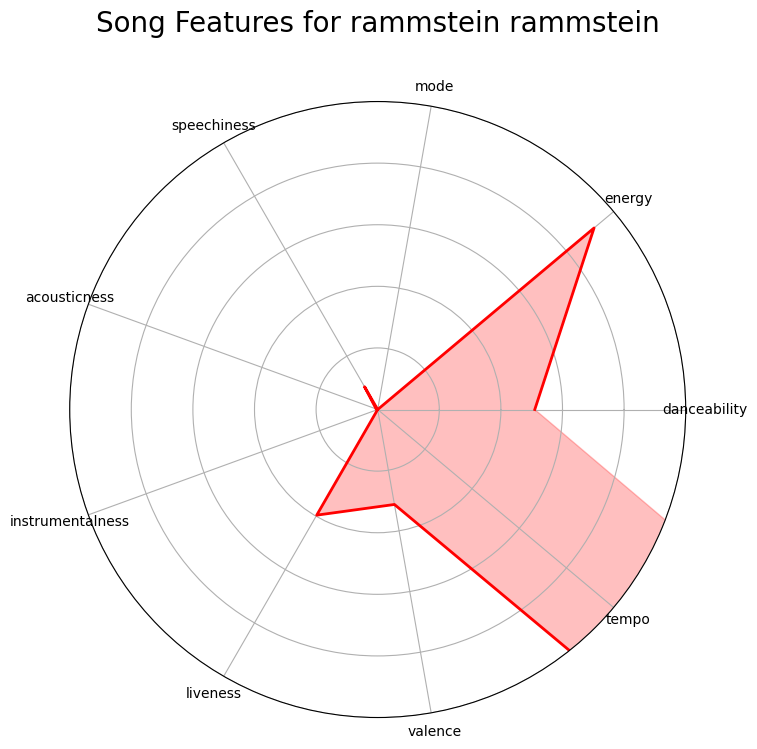

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming audio_features is a dictionary containing the feature names and values
values = [audio_features[feature] for feature in feature_columns]
labels = feature_columns

# Number of features
num_vars = len(labels)

# Calculate angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Set up the polar plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Draw the plot
ax.plot(angles, values, color='red', linewidth=2)
ax.fill(angles, values, color='red', alpha=0.25)

# Set the y-labels and axes limits
ax.set_yticklabels([])
ax.set_ylim(0, 1)

# Set the x-labels
ax.set_xticks(angles)
ax.set_xticklabels(labels)

# Add a title
ax.set_title(f"Song Features for {artist} {song}", size=20, y=1.1)

plt.show()


In [ ]:
input_song_df = pd.DataFrame([audio_features])[feature_columns]

# Add 'hot' to the input_song_df with a default value of 0


# Check if the song id is in the original all_songs_sampled DataFrame and whether hot or not
if spotify_id in all_songs_sampled['id'].iloc[:69].values:
    input_song_df['hot'] = 1
else:
  input_song_df['hot'] = 0
# Scale the input_song_df with the previously saved scaler
input_song_scaled = scaler.transform(input_song_df)

# Predict the cluster using the best_model
input_song_cluster = best_model.predict(input_song_scaled)

print(f"The input song belongs to cluster {input_song_cluster}")


The input song belongs to cluster [0]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


In [ ]:
# check first if the song id exists in the hot = 1 

# if not, return cluster 
# recommended_songs = all_songs_sampled[(all_songs_sampled['cluster'] == input_song_cluster[0]) & (all_songs_sampled['hot']==inputsong_df['hot'])

In [ ]:
# Now that we have the cluster, let's fetch the top 5 recommended songs from the same cluster 

recommended_songs = all_songs_sampled[(all_songs_sampled['cluster'] == input_song_cluster[0]) & all_songs_sampled['hot'] == input_song_df['hot'].iloc[0]]

top_songs = recommended_songs.sort_values(by='valence', ascending=False).head()

if input_song_df['hot'].iloc[0] == 1:
  print("It seems like you are into hot songs. Here are other {} recommended songs from the billboard:".format(top_songs.shape[0]))
else:
  print("It seems like you are not looking for hot songs. Here are your top 5 recommended songs:")
  
for i, row in top_songs.iterrows():
    song_url = f"https://open.spotify.com/track/{row['id']}"
    print(f"{i+1}. {row['name']} by {row['artists']} - {song_url}")

It seems like you are not looking for hot songs. Here are your top 5 recommended songs:
1341. Jig: The Old Grey Goose by Peter Horan', 'Gerry Harrington - https://open.spotify.com/track/7ewhxUnc5PE3Job9LtSBqN
1137. El Regañado by Marimba Orquesta Alma Tuneca - https://open.spotify.com/track/3q4z4wQ9CzZmXW4vU3Vo4d
213. Un Shipibo en España by Chicha Libre - https://open.spotify.com/track/4ukebaapUELmfFNecDqWrx
143. Tonn Cliodhna / An Seanchaí Muimhneach by Brendan Begley & Caoimhín Ó Raghallaigh - https://open.spotify.com/track/1vAFJ611eMq4tYfDRVwMUI
639. Con Cassidy's by Con Cassidy - https://open.spotify.com/track/1Tv5AzviQ8ObA7F3U3Ch4q


In [ ]:
# or even have a search bar function instead ?
from flask import Flask, jsonify, request, render_template

app = Flask(__name__)

@app.route('/')
def index():
    return render_template('index.html')

@app.route('/search', methods=['GET'])
def search():
    query = request.args.get('term', '')
    results = sp.search(q=query, type='track', limit=10)
    tracks = results['tracks']['items']
    suggestions = [{'label': f"{track['name']} - {track['artists'][0]['name']}", 'value': track['id']} for track in tracks]
    return jsonify(suggestions)

if __name__ == '__main__':
    app.run(debug=True)

In [ ]:
# from the recommended songs, show a link to spotify or a allow a preview of the song (similar to Tinder)
# generate a playlist of similar songs even, so the user can add it to his library? 

In [ ]:
# Test on the list of songs from Trello

- Overloading - Mavins https://open.spotify.com/track/4lVEVXrlQlXPdYWMGTwrFe?si=OToCDPusQ6iAGEtcjKcP0w&context=spotify%3Asearch%3Aoverd / 4lVEVXrlQlXPdYWMGTwrFe?si
- Love me like you do - Ellie Goulding https://open.spotify.com/track/7jtnrvoeBjkp3uQ4wtK9ue?autoplay=true / 7jtnrvoeBjkp3uQ4wtK9ue
- Unchained Melody - Righteous Brothers https://open.spotify.com/track/1jFhnVoJkcB4lf9tT0rSZS / 1jFhnVoJkcB4lf9tT0rSZS
- Quater past midnight - Bastille https://open.spotify.com/track/1etiUDkISHELzQGMY79ryt?si=1763c54575dd4b46 / 1etiUDkISHELzQGMY79ryt
- Over the Rainbow - Israel Kamakawiwo'ole https://open.spotify.com/track/4yDjzVhXig9tfO7Zv46FE8?si=kfJQE4wxRbiuHBpNX4Dhqg / 4yDjzVhXig9tfO7Zv46FE8
- Soso by Omah Lay https://open.spotify.com/track/1wADwLSkYhrSmy4vdy6BRn?si=b0MwDeZlTECbG-JW_v6SEg / 1wADwLSkYhrSmy4vdy6BRn
- Igor Krutoy You are in my September https://open.spotify.com/track/45S1TeYStrAk7GUktFUiq / 45S1TeYStrAk7GUktFUiq
- Talking Heads - This Must Be The Place https://open.spotify.com/track/6aBUnkXuCEQQHAlTokv9or?si=44c083e9b2df40b2 / 6aBUnkXuCEQQHAlTokv9or
- Mother of Sky - Can https://open.spotify.com/track/4cZM4JzqnMleplEHo7zNBa / 4cZM4JzqnMleplEHo7zNBa
- Spongebob Squarepants https://open.spotify.com/track/2LBpcqDEbzf8NfCa6VJWRs / 2LBpcqDEbzf8NfCa6VJWRs
- Lose yourself - Eminem https://open.spotify.com/track/7MJQ9Nfxzh8LPZ9e9u68Fq / 7MJQ9Nfxzh8LPZ9e9u68Fq
- Elva Hsiao - CAPPUCCINO https://open.spotify.com/track/3hCyGYmytCmkExrFmT4I7w / 3hCyGYmytCmkExrFmT4I7w

In [ ]:
# Arc technique 
# Tell the context / what's the problem? (use emotions) / insights (findings) / climax / next steps / resolution 

# have you ever been browsing through spotify when suddenly the next song that comes on is a completely different mood?
# have you ever been trying to create a playlist to fit your next dinner party discussing crypto currencies? 
# with our song recommender, we have built a revolutionary engine that analyses multiple features of your favorite song to suggest songs that are similar 
# you can easily import the list into a playlist in your library

In [ ]:
import matplotlib.pyplot as plt
from flask import Flask, jsonify, request, render_template
import numpy as np
import pandas as pd
#! pip install spotipy
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

import sys
sys.path.append('/content/drive/My Drive/ironhack/song_recommender/') # so that the credentials are fetched from the root and hidden
from config import client_id, client_secret

# client_id="ccd8d37043b74266ae9e37437c7d7b85"
# client_secret="334865d8ee5b4c669507d1d6891bd443"

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id= client_id,
                                                           client_secret= client_secret))
import pickle
from sklearn.preprocessing import StandardScaler
scaler=pickle.load(open('/content/drive/My Drive/ironhack/song_recommender/models/scaler/scaler.pickle','rb'))

best_model = load("/content/drive/My Drive/ironhack/song_recommender/models/models/kmeans_18.pickle")


ModuleNotFoundError: ignored

# Next steps

Moving forward

Convert to script, put in docker container, upload to heroku with link to github repo

Set up cron for weekly chart updates 

Deploy db on firebase, fetch features with API on the fly 

Develop frontend GUI 